In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import ArtistAnimation
from IPython.display import HTML
from MonteCarlo_Ising import*

# Monte Carlo simulation for classical Ising model in 2 dimension
- The Hamiltonian:
  $$
   H=J\sum_{\langle i,j\rangle}\sigma_i\sigma_j-h\sum_i \sigma_i
  $$
  $J$ is exchange interaction and $h$ is external magnetic field $\sigma_i \in \{1,-1\}$ means the value of spin on $i$-th site. $\langle i,j\rangle$ shows that only nearest interaction considered.

In [4]:
size=(50,50)
kb=1.0

## Ferro magnetism
### Display of one round
- At high temperature, the configuration remain in a disorder.

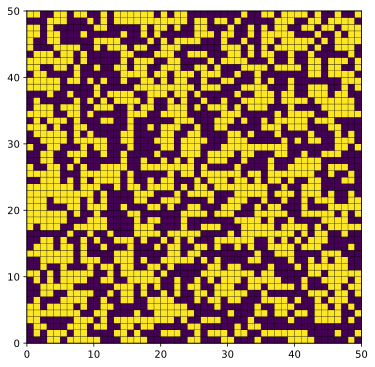

In [3]:
Th=10.0
J,h=-1.,0.
anih=ArtistAnimation(*DisplayOneRound(*size,Th,J,h,initial='uniform',method='MC',n_shots=60,MkvL=20000),blit=True)
HTML(anih.to_jshtml())

- At low temperature, the configuration evolve into ordered state and show domain wall.

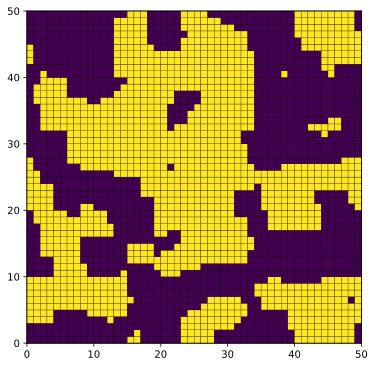

In [6]:
Tl=0.001
anil=ArtistAnimation(*DisplayOneRound(*size,Tl,J,h,initial='random',method='MC',n_shots=60,MkvL=20000),blit=True)
HTML(anil.to_jshtml())

### The transition between ordered phase and disordered phase

- Basic parameters

In [11]:
import gc
numT=100
Ts, dT=np.linspace(0.01,20.0,numT,retstep=True)
hs=[0.0, 1.0, -1.0]
J=-1.0
nsamp=1000

- Calculation

In [ ]:
energy_results=np.zeros((len(hs),numT))
moment_results=np.zeros((len(hs),numT))
varsq_results=np.zeros((len(hs),numT))
for (i,h) in enumerate(hs):
    for (j,T) in enumerate(Ts):
        res=Mean_result(*size,T,nsamp,J_int=J,h_ext=h,method='MC')
        energy_results[i,j]=res.energy
        moment_results[i,j]=res.moment
        varsq_results[i,j]=res.varsq
np.savez('data.npz',energy_results,moment_results,varsq_results)
del energy_results,moment_results,varsq_results
gc.collect()

29627

- Ground state energy vs temperature

In [5]:
datafile=np.load('data.npz')

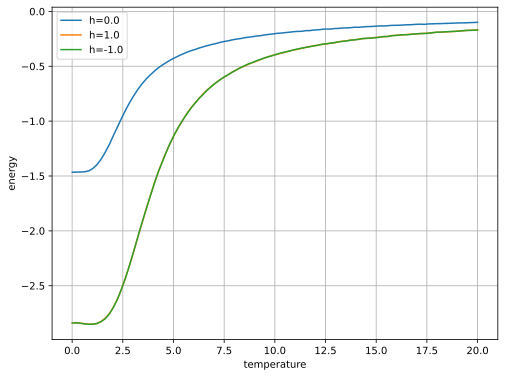

In [6]:
fige,axe=plt.subplots(figsize=(8,6))
energies=datafile['arr_0']
for i in range(len(hs)):
    axe.plot(Ts,energies[i],label="h={:.1f}".format(hs[i]))
axe.legend()
axe.set(xlabel="temperature",ylabel="energy")
axe.grid()
plt.show()

- Ground state energy variance

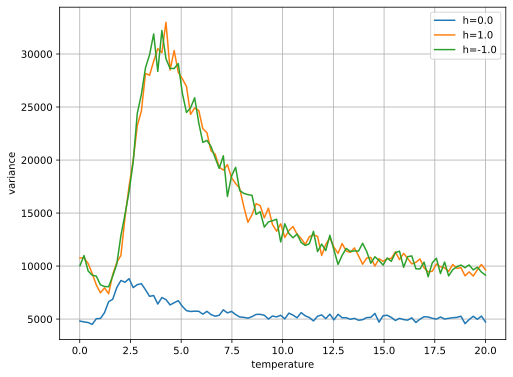

In [8]:
figv,axv=plt.subplots(figsize=(8,6))
varsqs=datafile['arr_2']
for i in range(len(hs)):
    axv.plot(Ts,varsqs[i],label="h={:.1f}".format(hs[i]))
axv.legend()
axv.grid()
axv.set(xlabel="temperature",ylabel="variance")
plt.show()

- Ground state average magnetic moment

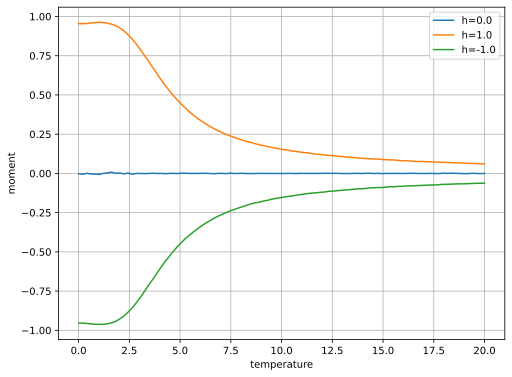

In [8]:
figm,axm=plt.subplots(figsize=(8,6))
moments=datafile['arr_1']
for i in range(len(hs)):
    axm.plot(Ts,moments[i],label="h={:.1f}".format(hs[i]))
axm.legend()
axm.grid()
axm.set(xlabel="temperature",ylabel="moment")
plt.show()

- Ground state capacity

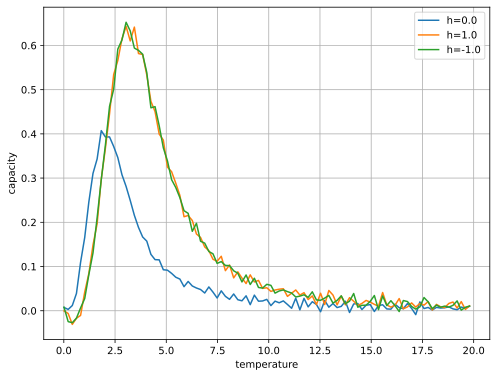

In [25]:
diff_E_T = (energies[:,1:] - energies[:,:-1])/dT # differentiate energy w.r.t. temperature

figc,axc=plt.subplots(figsize=(8,6))
for i in range(len(hs)):
    axc.plot(Ts[:-1],diff_E_T[i],label="h={:.1f}".format(hs[i]))
axc.legend()
axc.grid()
axc.set(xlabel="temperature",ylabel="capacity")
plt.show()